In [1]:
pip install scanpy -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install igraph -q

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install louvain -q

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install pandas -q

Note: you may need to restart the kernel to use updated packages.


In [5]:
import scanpy as sc
import pandas as pd
import numpy as np

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
adata = sc.read_h5ad('AnnDataObject.h5ad')

In [8]:
adata.rename_categories('sample', ['Control', 'Enz', 'Enz+Taz'])

# Quality Control

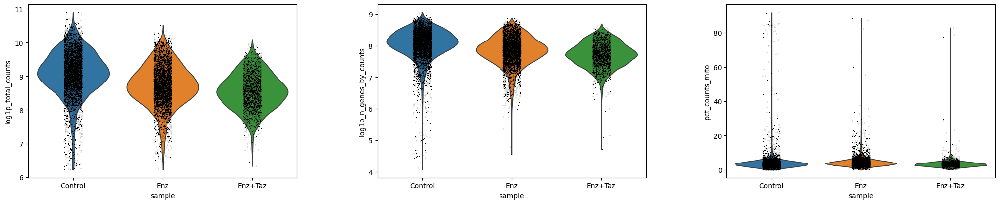

In [9]:
# Violin - genotype - log
sc.pl.violin(
  adata,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='sample',
  save='-genotype-log.png'
)

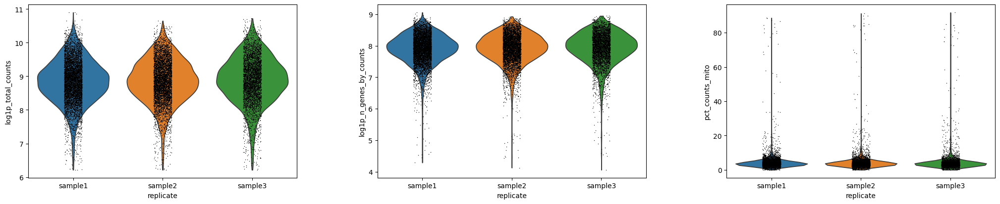

In [10]:
# Violin - sex - log
sc.pl.violin(
  adata,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-sex-log.png'
)

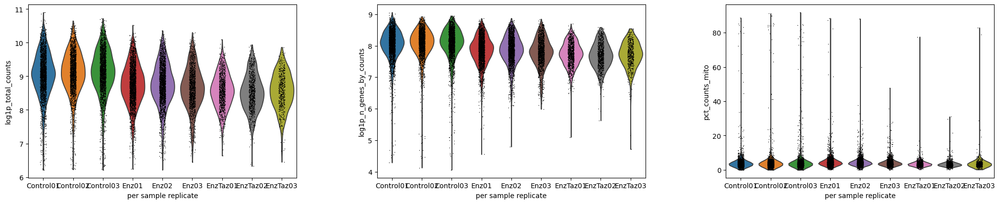

In [11]:
# Violin - sex - log
sc.pl.violin(
  adata,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='per_sample_replicate',
  save='-sex-log.png'
)

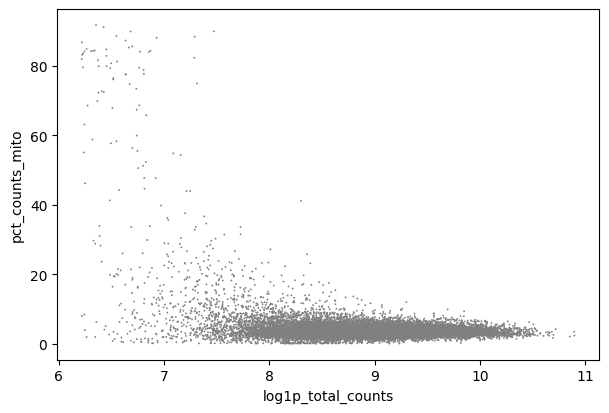

In [12]:
# Scatter - mito x UMIs
sc.pl.scatter(
  adata,
  x='log1p_total_counts',
  y='pct_counts_mito',
  save='-mitoxUMIs.png'
)

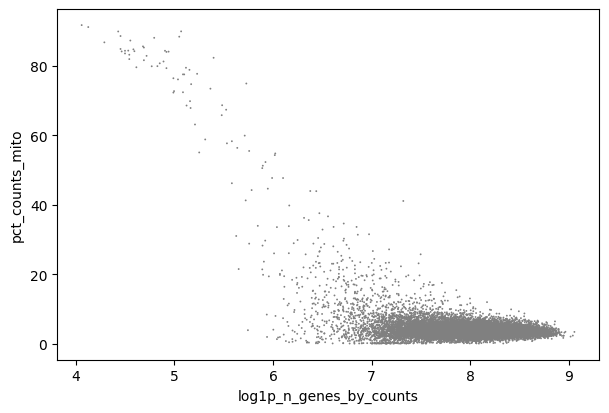

In [13]:
# Scatter - mito x genes
sc.pl.scatter(
  adata,
  x='log1p_n_genes_by_counts',
  y='pct_counts_mito',
  save='-mitoxgenes.png'
)

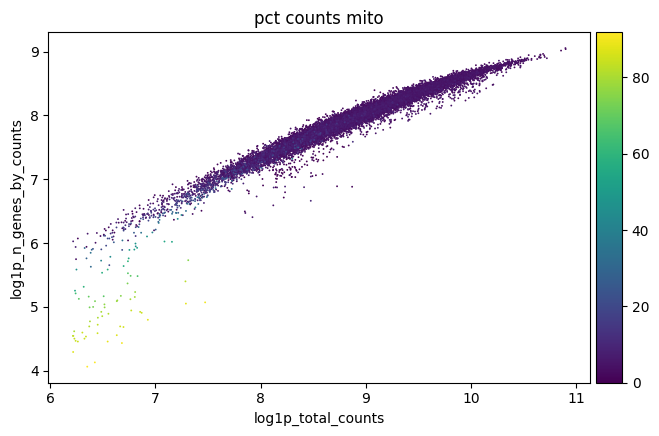

In [14]:
# Scatter - genes x UMIs
sc.pl.scatter(
  adata,
  x='log1p_total_counts',
  y='log1p_n_genes_by_counts',
  color='pct_counts_mito',
  save='-genesxUMIs.png'
)

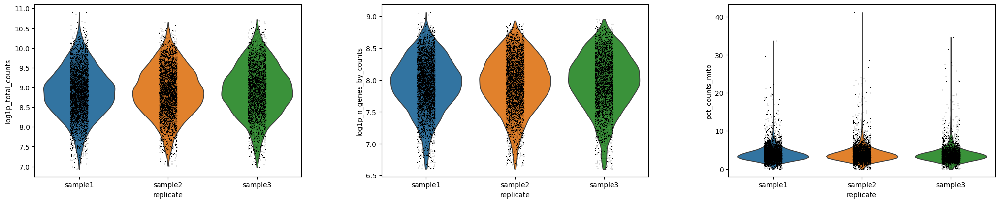

In [15]:
genes_filtered_obj = adata[adata.obs['log1p_n_genes_by_counts'] >= 6.6]
#genes_filtered_obj = genes_filtered_obj[genes_filtered_obj.obs['log1p_n_genes_by_counts'] <= 20.0]

# Violin - Filterbygenes
sc.pl.violin(
  genes_filtered_obj,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-Filterbygenes.png'
)

In [16]:
# 17051 × 36601
print(genes_filtered_obj)

View of AnnData object with n_obs × n_vars = 16803 × 36601
    obs: 'batch', 'sample', 'replicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'pct_counts_in_top_50_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'per_sample_replicate'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'mito'
    uns: 'sample_colors', 'replicate_colors', 'per_sample_replicate_colors'


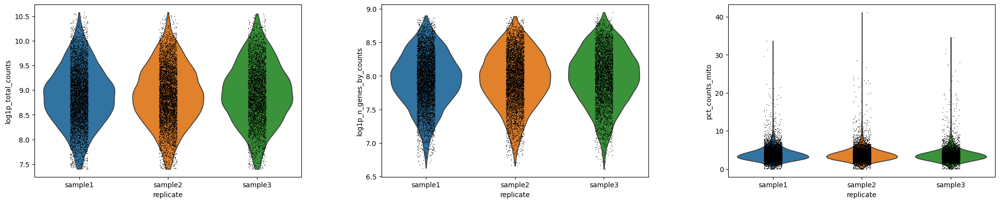

In [17]:
counts_filtered_obj = genes_filtered_obj[genes_filtered_obj.obs['log1p_total_counts'] >=  7.4]
counts_filtered_obj = counts_filtered_obj[counts_filtered_obj.obs['log1p_total_counts'] <= 10.6]

# Violin - Filterbycounts
sc.pl.violin(
  counts_filtered_obj,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-Filterbycounts.png'
)

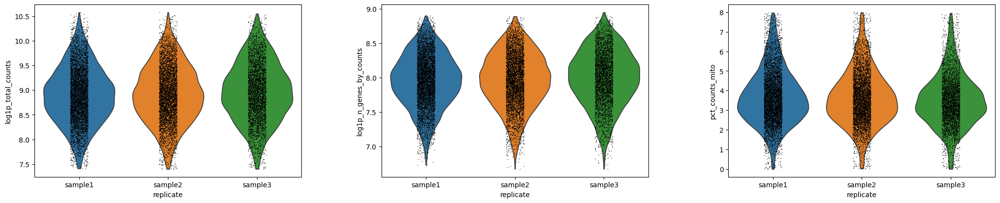

In [18]:
mito_filtered_obj = counts_filtered_obj[counts_filtered_obj.obs['pct_counts_mito'] >=  0]
mito_filtered_obj = mito_filtered_obj[mito_filtered_obj.obs['pct_counts_mito'] <= 8]

# Violin - Filterbymito
sc.pl.violin(
  mito_filtered_obj,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-Filterbymito.png'
)

In [19]:
filtered_obj = genes_filtered_obj.copy()

sc.pp.filter_genes(filtered_obj, min_cells=3)
sc.pp.filter_genes(filtered_obj, max_cells=1000000000)

#16803 × 36601
print(filtered_obj)

AnnData object with n_obs × n_vars = 16803 × 27788
    obs: 'batch', 'sample', 'replicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'pct_counts_in_top_50_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'per_sample_replicate'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'mito'
    uns: 'sample_colors', 'replicate_colors', 'per_sample_replicate_colors'


In [20]:
out_adata = filtered_obj.copy()

out_adata.X = out_adata.X.astype(int)
out_adata.write_h5ad('anndata-objects/anndata-filtered.h5ad')

# Normalise Data

In [21]:
output_h5ad = filtered_obj.copy()
sc.pp.normalize_total(output_h5ad)

In [22]:
output_h5ad = sc.pp.log1p(output_h5ad, copy=True)  # below function requires log scaled data
sc.pp.highly_variable_genes(output_h5ad)

In [23]:
scaled_data = sc.pp.scale(output_h5ad, max_value=10.0, copy=True)

# Clustering - PCA Components

In [24]:
pca_components = sc.tl.pca(scaled_data, n_comps=50, copy=True)

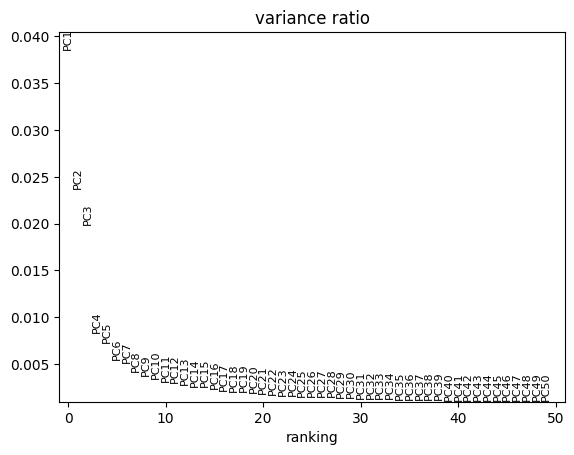

In [25]:
sc.pl.pca_variance_ratio(pca_components, n_pcs=50, save='-variance-ratio.png')

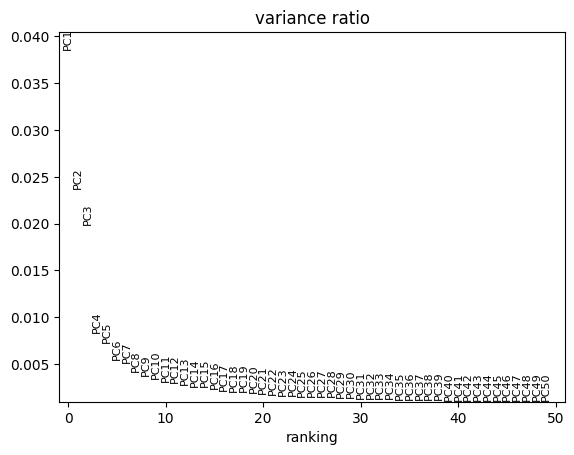

In [26]:
sc.pl.pca_variance_ratio(pca_components, n_pcs=50, save='-variance-ratio.png')

In [27]:
neighbours = sc.pp.neighbors(pca_components, n_neighbors=15, use_rep='X_pca', n_pcs=25, copy=True)

2025-03-02 19:13:12.115363: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-02 19:13:12.278447: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-02 19:13:12.278500: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-02 19:13:12.279345: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-02 19:13:12.370989: I tensorflow/core/platform/cpu_feature_g

In [28]:
tsne_components = sc.tl.tsne(neighbours, use_rep='X_pca', perplexity=30, copy=True)

In [29]:
umap_components = sc.tl.umap(tsne_components, copy=True)

# Find Clusters

In [30]:
# Find Clusters
clusters = sc.tl.louvain(umap_components, resolution=0.6, copy=True)  # change resolution to 0.9 for more clusters

In [31]:
markers_cluster = sc.tl.rank_genes_groups(clusters, groupby="louvain", method='t-test_overestim_var', n_genes=50, copy=True)

In [32]:
markers_genotype = sc.tl.rank_genes_groups(markers_cluster, groupby="sample", method='t-test_overestim_var', n_genes=50, copy=True)

In [33]:
def generate_marker_table(adata):
    # extract marker table metadata
    res = adata.uns['rank_genes_groups']

    # generate DataFrame from metadata
    res_df = pd.DataFrame({
                "genes": pd.DataFrame(res["names"]).stack(),
                "scores": pd.DataFrame(res["scores"]).stack(),
                "logfoldchanges": pd.DataFrame(res["logfoldchanges"]).stack(),
                "pvals": pd.DataFrame(res["pvals"]).stack(),
                "pvals_adj": pd.DataFrame(res["pvals_adj"]).stack(),
            })

    # convert row names to columns
    res_df.index.name = 'newhead'
    res_df.reset_index(inplace=True)

    # rename generic column names
    res_df = res_df.rename(columns={'level_0': 'rank', 'level_1':'cluster'})

    # reorder columns
    res_df = res_df.reindex(columns=['cluster', 'rank', 'genes', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj'])

    # insert ref column
    res_df.insert(2, 'ref', 'rest')

    return res_df

In [34]:
# Generate marker tables
cluster_marker_table = generate_marker_table(markers_cluster)
genotype_marker_table = generate_marker_table(markers_genotype)

display(cluster_marker_table.head(4))
display(genotype_marker_table.head(4))

,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj
0,0,0,rest,ZBTB16,66.012032,NaN,0.000000e+00,0.000000e+00
1,1,0,rest,MIR99AHG,78.996391,NaN,0.000000e+00,0.000000e+00
2,2,0,rest,RPL36,33.665840,NaN,2.539224e-224,7.055997e-220
3,3,0,rest,TUBA1B,66.689743,NaN,0.000000e+00,0.000000e+00


,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj
0,Control,0,rest,HSPB1,88.167435,NaN,0.000000e+00,0.000000e+00
1,Enz,0,rest,ANK3,62.797318,NaN,0.000000e+00,0.000000e+00
2,Enz+Taz,0,rest,MT-ATP8,36.424435,NaN,7.707143e-260,2.141661e-255
3,Control,1,rest,UBC,84.057739,NaN,0.000000e+00,0.000000e+00


# Differential Gene Expression Analysis

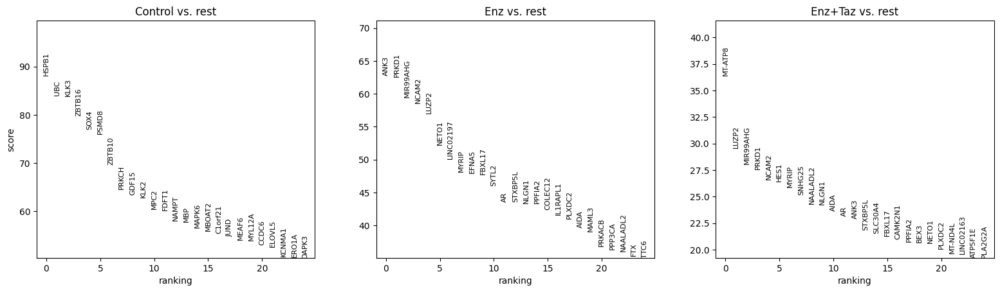

In [35]:
sc.tl.rank_genes_groups(clusters, groupby="sample", method='t-test_overestim_var', key_added = "t-test_ov")
sc.pl.rank_genes_groups(clusters, n_genes=25, sharey=False, key = "t-test_ov", ncols=3, save="_t-test_ov_all.png")

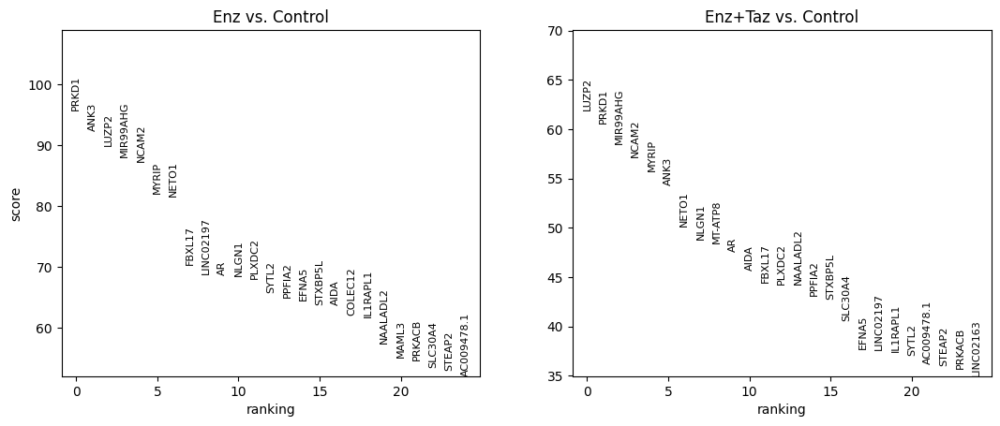

In [36]:
sc.tl.rank_genes_groups(
    clusters, 
    groupby="sample", 
    method="t-test_overestim_var", 
    groups=["Enz", "Enz+Taz"], 
    reference="Control", 
    key_added="ControlvsSamples"
)
sc.pl.rank_genes_groups(clusters, n_genes=25, sharey=False, key = "ControlvsSamples", ncols=3)

In [37]:
enz_control_degs = sc.get.rank_genes_groups_df(clusters, group='Enz', key="ControlvsSamples")

enz_control_degs.head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,PRKD1,95.784042,NaN,0.0,0.0
1,ANK3,92.286385,NaN,0.0,0.0
2,LUZP2,89.940903,NaN,0.0,0.0
3,MIR99AHG,88.066238,NaN,0.0,0.0
4,NCAM2,87.242538,NaN,0.0,0.0
5,MYRIP,82.046265,NaN,0.0,0.0
6,NETO1,81.552498,NaN,0.0,0.0
7,FBXL17,70.395241,NaN,0.0,0.0
8,LINC02197,68.886642,NaN,0.0,0.0
9,AR,68.656578,NaN,0.0,0.0


In [38]:
enztaz_control_degs = sc.get.rank_genes_groups_df(clusters, group='Enz+Taz', key="ControlvsSamples")

enztaz_control_degs.head(10)

,names,scores,logfoldchanges,pvals,pvals_adj
0,LUZP2,61.953964,NaN,0.0,0.0
1,PRKD1,60.623280,NaN,0.0,0.0
2,MIR99AHG,58.518085,NaN,0.0,0.0
3,NCAM2,57.214512,NaN,0.0,0.0
4,MYRIP,55.756561,NaN,0.0,0.0
5,ANK3,54.288033,NaN,0.0,0.0
6,NETO1,50.163097,NaN,0.0,0.0
7,NLGN1,48.837811,NaN,0.0,0.0
8,MT-ATP8,48.412628,NaN,0.0,0.0
9,AR,47.628052,NaN,0.0,0.0


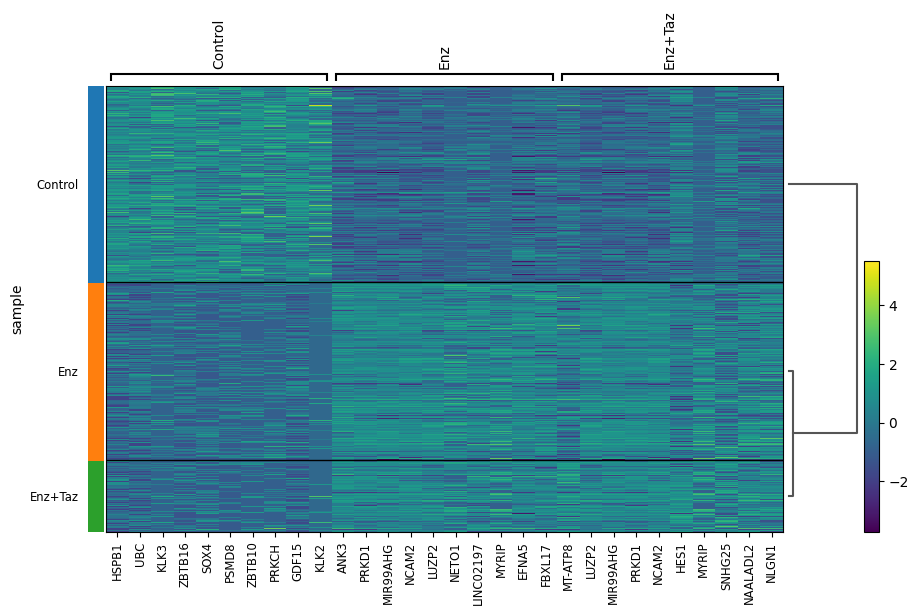

In [39]:
sc.pl.rank_genes_groups_heatmap(clusters, n_genes=10, key="t-test_ov", groupby="sample", show_gene_labels=True, save="all.png")

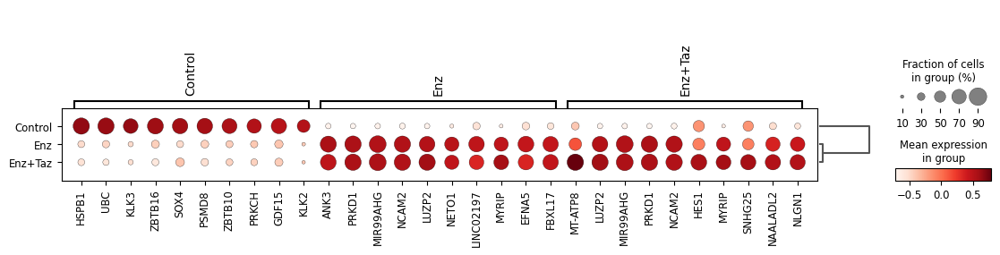

In [40]:
sc.pl.rank_genes_groups_dotplot(clusters, n_genes=10, key="t-test_ov", groupby="sample", save="all.png")

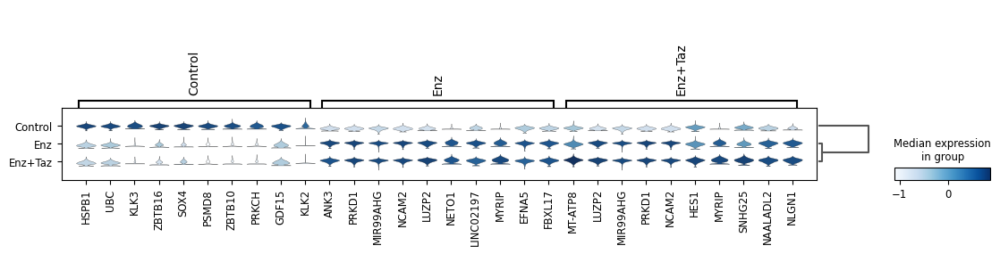

In [41]:
sc.pl.rank_genes_groups_stacked_violin(clusters, n_genes=10, key="t-test_ov", groupby="sample", save="all.png")

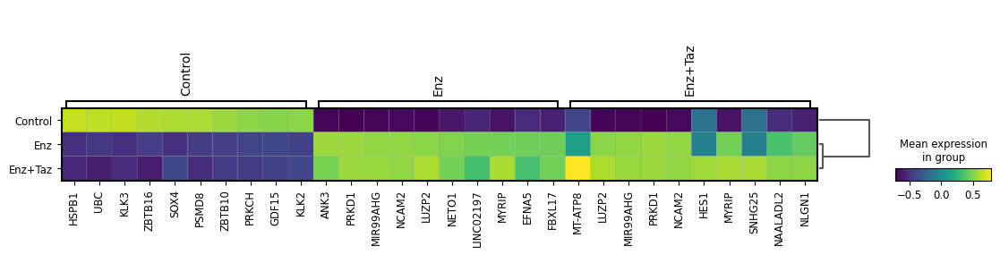

In [42]:
sc.pl.rank_genes_groups_matrixplot(clusters, n_genes=10, key="t-test_ov", groupby="sample", save="all.png")

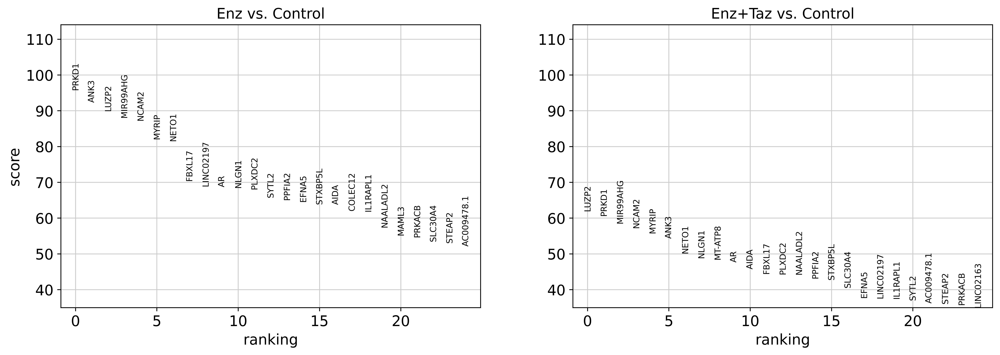

In [43]:
sc.set_figure_params(figsize=(8,5), dpi=300, dpi_save=300)
sc.tl.rank_genes_groups(clusters, 'sample', groups=['Enz', 'Enz+Taz'], reference='Control', method='t-test_overestim_var')
sc.pl.rank_genes_groups(clusters, groups=['Enz', 'Enz+Taz'], n_genes=25, save="treatments_vs_control.png")

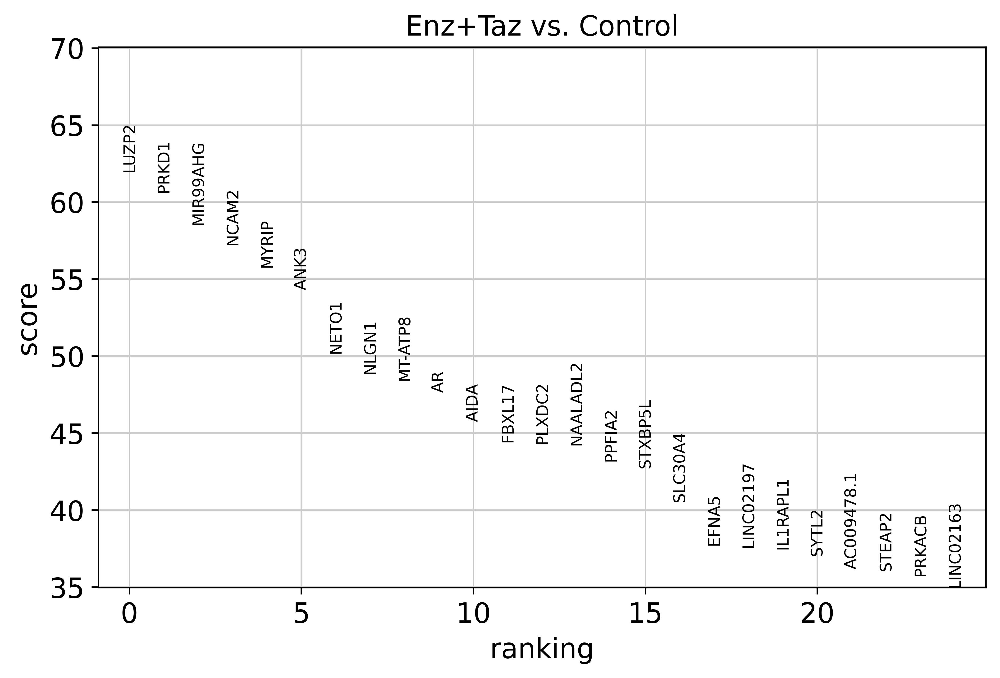

In [44]:
sc.tl.rank_genes_groups(clusters, 'sample', groups=['Enz+Taz'], reference='Control', method='t-test_overestim_var')
sc.pl.rank_genes_groups(clusters, groups=['Enz+Taz'], n_genes=25, save="enz-taz_vs_control.png")

In [45]:
sc.tl.rank_genes_groups(clusters, groupby="louvain", method='t-test_overestim_var', key_added = "t-test_ov")
sc.pl.rank_genes_groups(clusters, n_genes=25, sharey=False, key = "t-test_ov", ncols=2, save="_t-test_ov_total.png")

In [46]:
cluster_marker_table.index

RangeIndex(start=0, stop=300, step=1)

In [47]:
# Join two datasets

cluster_joined = pd.merge(cluster_marker_table, markers_cluster.var, left_on='genes', right_index=True)
genotype_joined = pd.merge(genotype_marker_table, markers_genotype.var, left_on='genes', right_index=True)

display(cluster_joined.head(5))
display(genotype_joined.head(5))

,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj,gene_ids,feature_types,...,log1p_total_counts,n_counts,n_cells,mito,highly_variable,means,dispersions,dispersions_norm,mean,std
0,0,0,rest,ZBTB16,66.012032,NaN,0.000000e+00,0.000000e+00,ENSG00000109906,Gene Expression,...,11.092549,65679.0,12363,False,True,1.329822,1.218210,0.505386,1.032622,0.780258
1,1,0,rest,MIR99AHG,78.996391,NaN,0.000000e+00,0.000000e+00,ENSG00000215386,Gene Expression,...,13.682394,875362.0,16617,False,False,3.908110,3.364510,0.901977,3.557251,0.958668
29,5,4,rest,MIR99AHG,19.297861,NaN,2.027138e-72,2.449135e-70,ENSG00000215386,Gene Expression,...,13.682394,875362.0,16617,False,False,3.908110,3.364510,0.901977,3.557251,0.958668
2,2,0,rest,RPL36,33.665840,NaN,2.539224e-224,7.055997e-220,ENSG00000130255,Gene Expression,...,12.845864,379216.0,16320,False,False,2.961789,1.797755,-0.483061,2.770867,0.724399
3,3,0,rest,TUBA1B,66.689743,NaN,0.000000e+00,0.000000e+00,ENSG00000123416,Gene Expression,...,10.267054,28768.0,6520,False,True,0.736063,1.778960,4.419803,0.420609,0.663544


,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj,gene_ids,feature_types,...,log1p_total_counts,n_counts,n_cells,mito,highly_variable,means,dispersions,dispersions_norm,mean,std
0,Control,0,rest,HSPB1,88.167435,NaN,0.000000e+00,0.000000e+00,ENSG00000106211,Gene Expression,...,12.320223,224183.0,15211,False,True,2.392488,2.722080,3.422745,1.905470,1.019584
1,Enz,0,rest,ANK3,62.797318,NaN,0.000000e+00,0.000000e+00,ENSG00000151150,Gene Expression,...,11.986485,160569.0,15423,False,True,2.292375,2.178072,1.824270,1.889092,0.958740
38,Enz+Taz,12,rest,ANK3,22.906332,NaN,1.229254e-110,1.423271e-107,ENSG00000151150,Gene Expression,...,11.986485,160569.0,15423,False,True,2.292375,2.178072,1.824270,1.889092,0.958740
2,Enz+Taz,0,rest,MT-ATP8,36.424435,NaN,7.707143e-260,2.141661e-255,ENSG00000228253,Gene Expression,...,11.394671,88846.0,15844,True,True,1.887384,1.972711,2.197311,1.599710,0.746103
3,Control,1,rest,UBC,84.057739,NaN,0.000000e+00,0.000000e+00,ENSG00000150991,Gene Expression,...,11.715180,122415.0,14740,False,True,1.885500,1.931380,2.092746,1.528969,0.861450


In [48]:
# Cut columns from tables

cluster_markers_named = cluster_joined[['cluster', 'ref', 'rank', 'genes', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj']]
genotype_markers_named = genotype_joined[['cluster', 'ref', 'rank', 'genes', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj']]

display(cluster_markers_named.head(5))
display(genotype_markers_named.head(5))

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
0,0,rest,0,ZBTB16,66.012032,NaN,0.000000e+00,0.000000e+00
1,1,rest,0,MIR99AHG,78.996391,NaN,0.000000e+00,0.000000e+00
29,5,rest,4,MIR99AHG,19.297861,NaN,2.027138e-72,2.449135e-70
2,2,rest,0,RPL36,33.665840,NaN,2.539224e-224,7.055997e-220
3,3,rest,0,TUBA1B,66.689743,NaN,0.000000e+00,0.000000e+00


,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
0,Control,rest,0,HSPB1,88.167435,NaN,0.000000e+00,0.000000e+00
1,Enz,rest,0,ANK3,62.797318,NaN,0.000000e+00,0.000000e+00
38,Enz+Taz,rest,12,ANK3,22.906332,NaN,1.229254e-110,1.423271e-107
2,Enz+Taz,rest,0,MT-ATP8,36.424435,NaN,7.707143e-260,2.141661e-255
3,Control,rest,1,UBC,84.057739,NaN,0.000000e+00,0.000000e+00


In [49]:
sorted_markers = cluster_markers_named.sort_values(by='scores', ascending=False)

In [50]:
sorted_markers.head(100)

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
1,1,rest,0,MIR99AHG,78.996391,NaN,0.000000e+00,0.000000e+00
7,1,rest,1,ANK3,77.934570,NaN,0.000000e+00,0.000000e+00
13,1,rest,2,PRKD1,76.312500,NaN,0.000000e+00,0.000000e+00
19,1,rest,3,NCAM2,74.247139,NaN,0.000000e+00,0.000000e+00
25,1,rest,4,LUZP2,68.626755,NaN,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...
201,3,rest,33,UBE2C,39.241955,NaN,1.292382e-256,9.706141e-254
229,1,rest,38,LRBA,39.214943,NaN,0.000000e+00,0.000000e+00
144,0,rest,24,RBPJ,39.133717,NaN,0.000000e+00,0.000000e+00
235,1,rest,39,TBL1XR1,38.973686,NaN,2.156238e-308,1.302555e-305


# Cluster plots

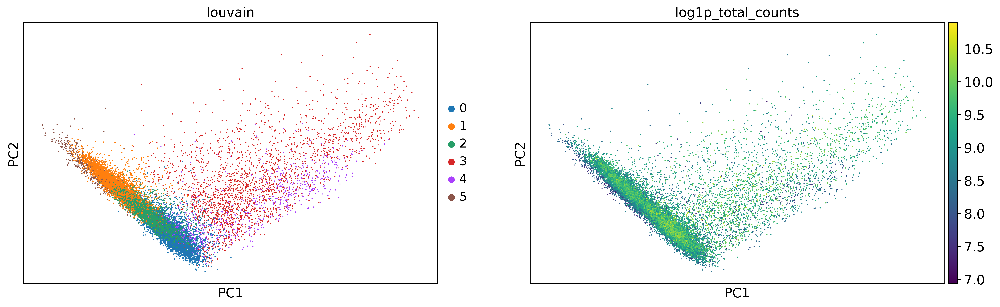

In [51]:
# PCA
sc.pl.embedding(
    markers_cluster,
    basis='pca',  
    color=['louvain','log1p_total_counts'],
    use_raw=False,
    save='.png'
)

In [52]:
sc.set_figure_params(figsize=(5,5), dpi=200, dpi_save=200)

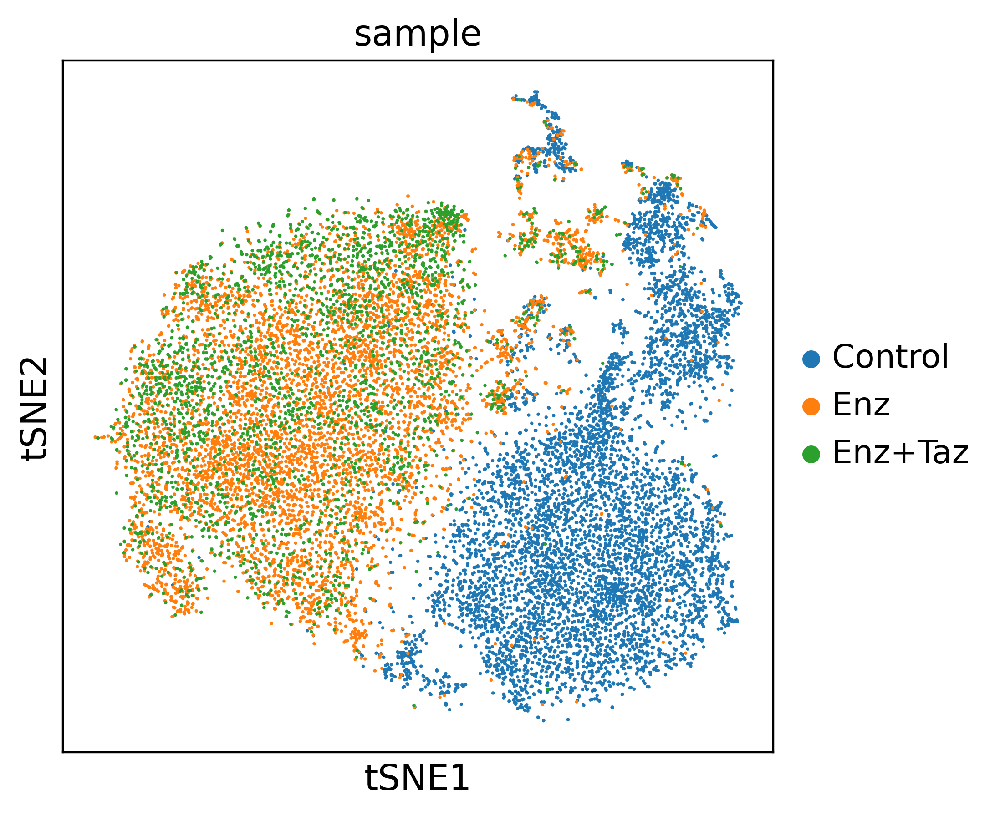

In [53]:
# TSNE
sc.pl.embedding(
    markers_cluster,
    basis='tsne',  
    color=['sample'],
    use_raw=False,
    ncols=1,
    save='.png'
)

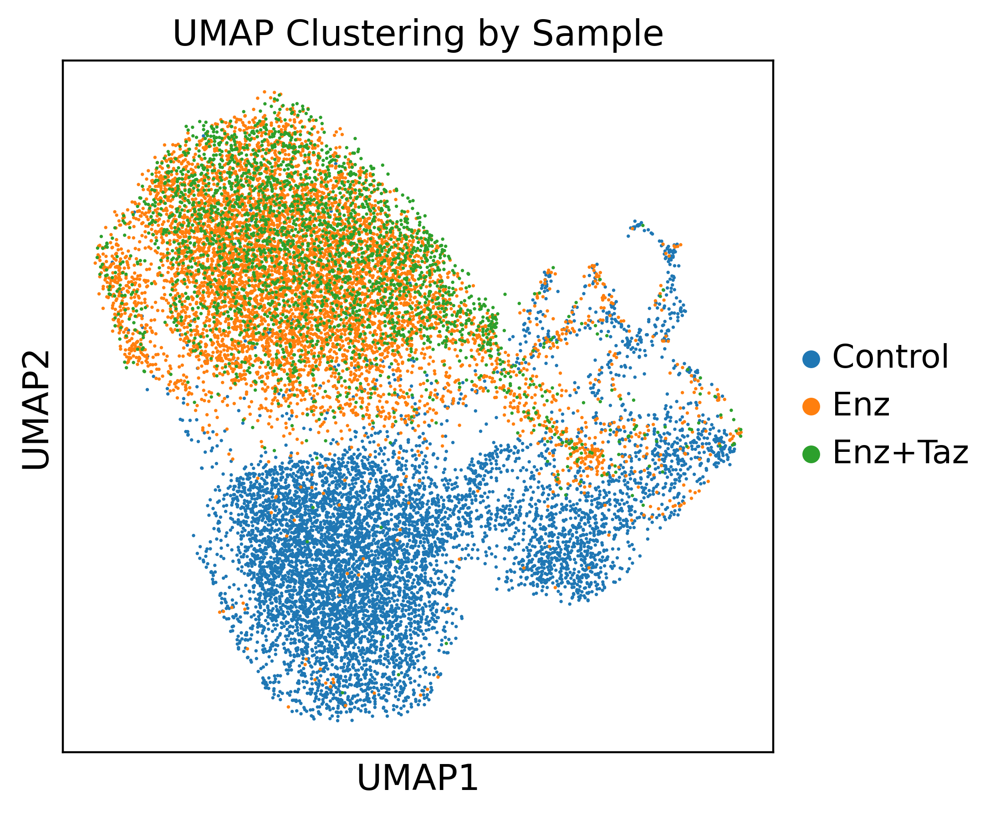

In [54]:
# TSNE
sc.pl.embedding(
    markers_cluster,
    title='UMAP Clustering by Sample',
    basis='umap',  
    color=['sample'],
    use_raw=False,
    ncols=1,
    save='-sample.png'
)

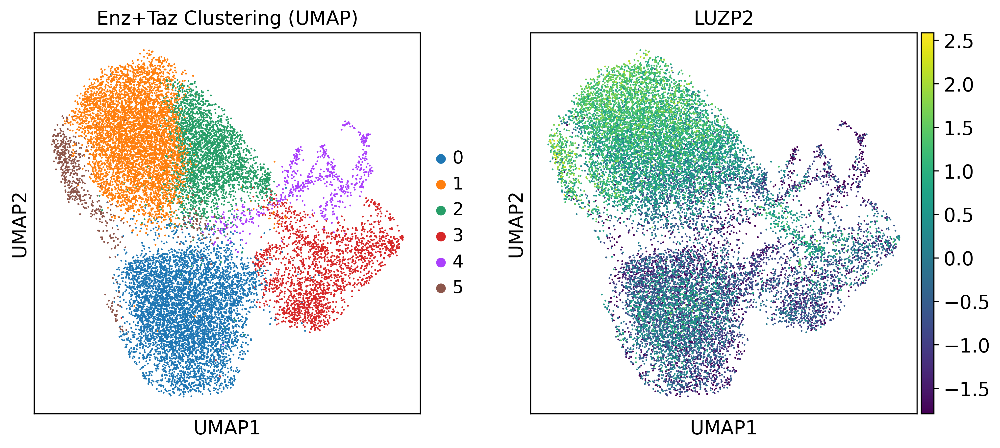

In [55]:
sc.pl.embedding(
    markers_cluster,
    title='Enz+Taz Clustering (UMAP)',
    basis='umap',  
    color=['louvain', 'LUZP2'],
    use_raw=False,
    save='.png'
)

In [56]:
#markers_cluster.write_h5ad('anndata-objects/anndata.h5ad')